# 0413 - 卷積神經網路(CNN)
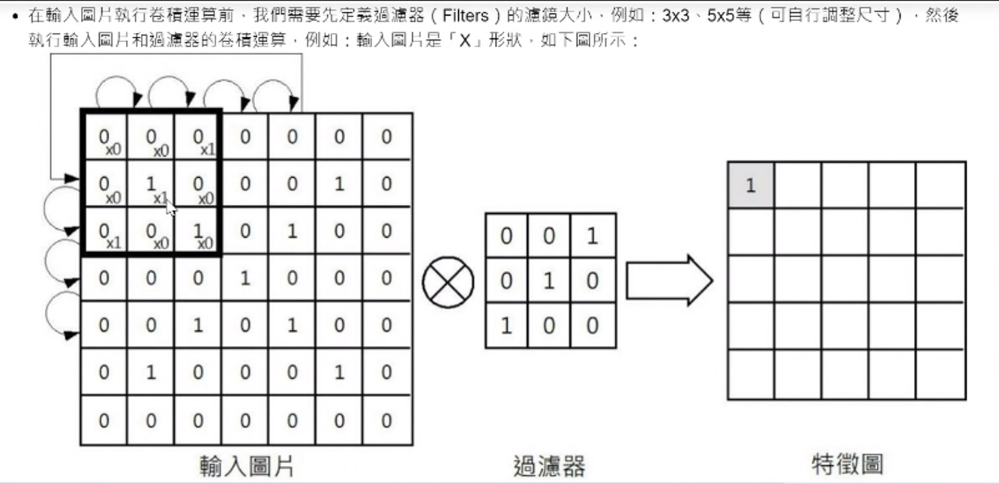
得到以下特徵圖：
$$map = \left[\begin{array}{ccccc}1 & 0 & 0 & 0 & 2\\ 0 & 1 & 0 & 2 & 0 \\  0& 0 & 3 & 0 & 0 \\ 0 & 2 & 0 & 1 & 0\\ 2 & 0 & 0 & 0 & 1\end{array}\right]$$

## 以numpy匯入灰階圖片

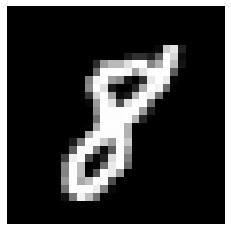

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

img = np.load("./data/digit8.npy")

plt.figure()
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.show()


## 使用卷積過濾器偵測邊界變化

對上面的圖片使用過濾器$edge$進行邊界偵測。

$$edge = \left[\begin{array}{ccccc}0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0\end{array}\right]$$

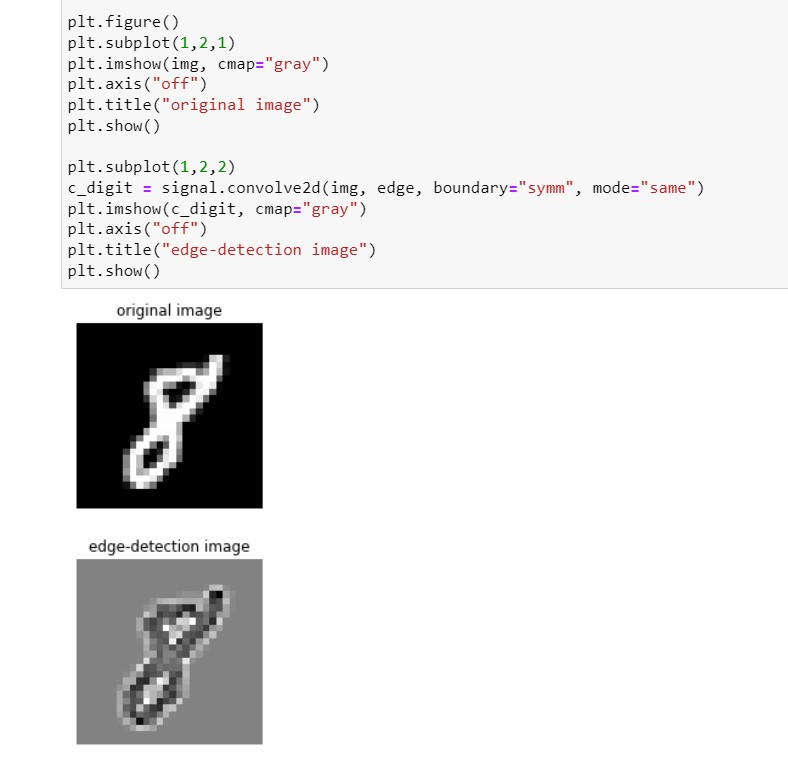

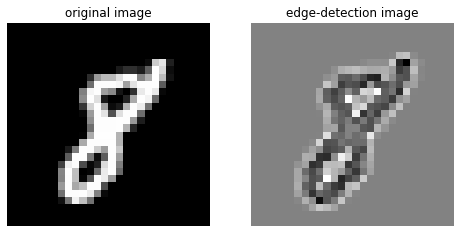

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
%matplotlib inline

img = np.load("./data/digit8.npy")
edge = [[0,1,0],
        [1,-4,1],
        [0,1,0]
       ]

plt.figure(figsize=[8,8])
plt.subplot(1,2,1)
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.title("original image")

plt.subplot(1,2,2)
c_digit = signal.convolve2d(img, edge, boundary="symm",mode="same")
plt.imshow(c_digit, cmap="gray")
plt.axis("off")
plt.title("edge-detection image")

plt.show()


## 水平與垂直邊緣偵測

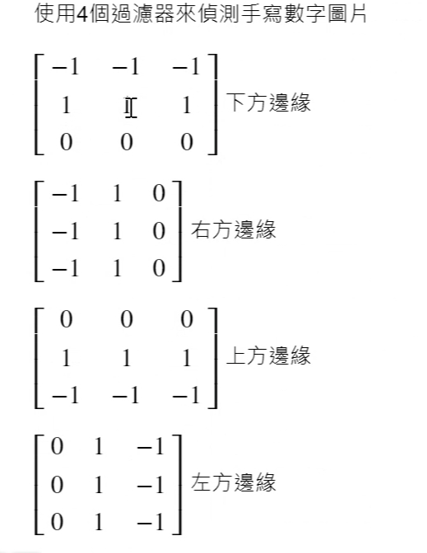
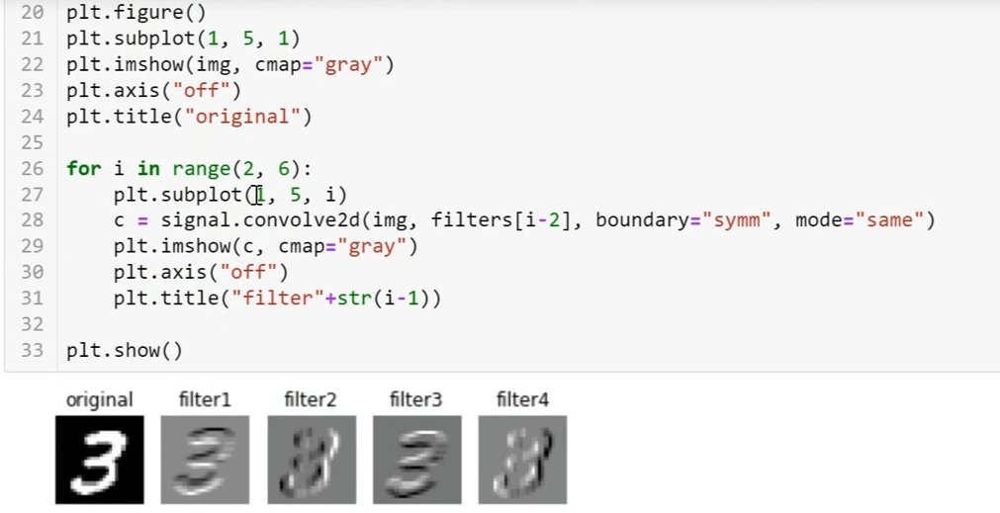

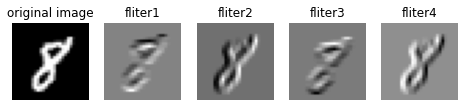

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
%matplotlib inline

img = np.load("./data/digit8.npy")
fliter = [[[-1,-1,-1],
           [ 1, 1, 1],
           [ 0, 0, 0]],
          [[-1, 1, 0],
           [-1, 1, 0],
           [-1, 1, 0]],
          [[ 0, 0, 0],
           [ 1, 1, 1],
           [-1,-1,-1]],
          [[ 0, 1,-1],
           [ 0, 1,-1],
           [ 0, 1,-1]]]

plt.figure(figsize=[8,8])
plt.subplot(1,5,1)
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.title("original image")

for i in range(2,6):
    plt.subplot(1,5,i)
    c_digit = signal.convolve2d(img, fliter[i-2], boundary="symm",mode="same")
    plt.imshow(c_digit, cmap="gray")
    plt.axis("off")
    plt.title("fliter"+str(i-1))

plt.show()

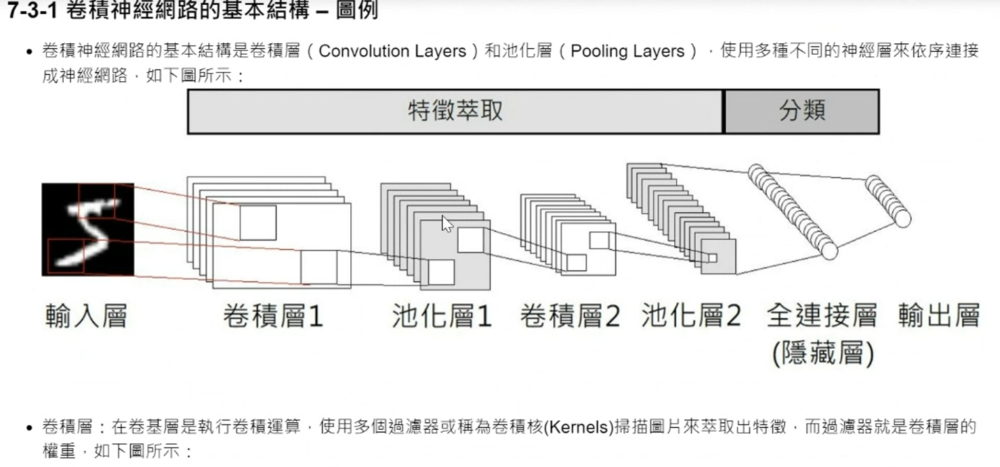
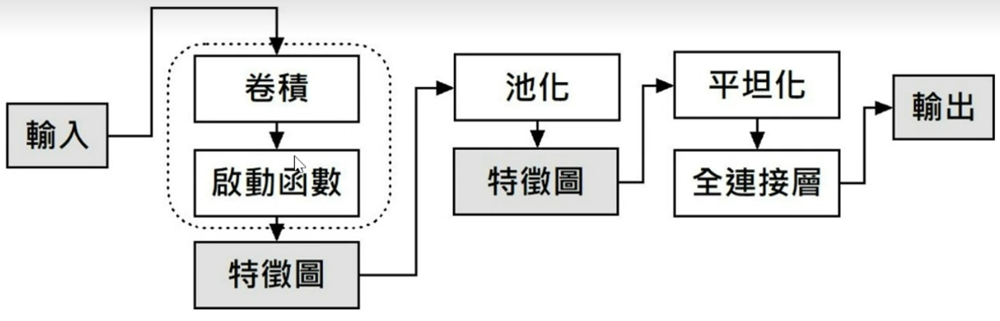
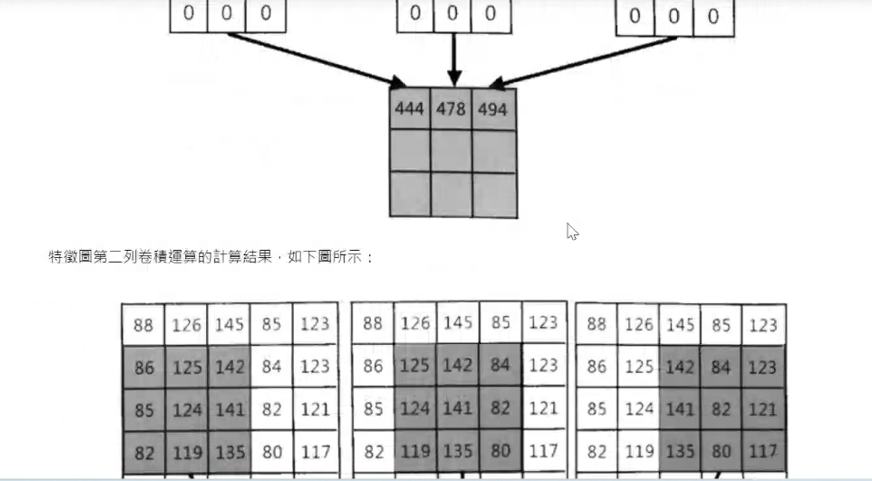
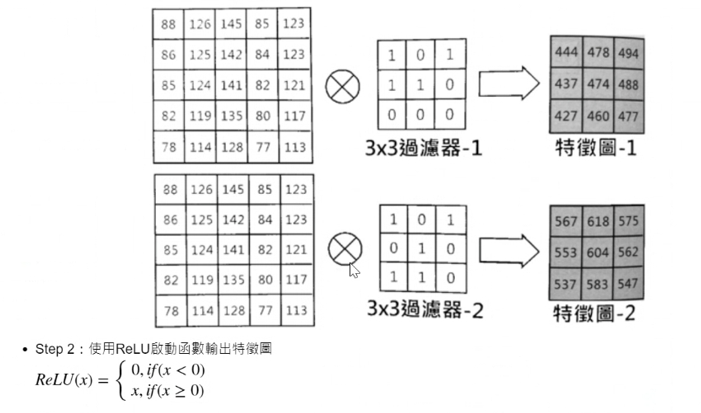
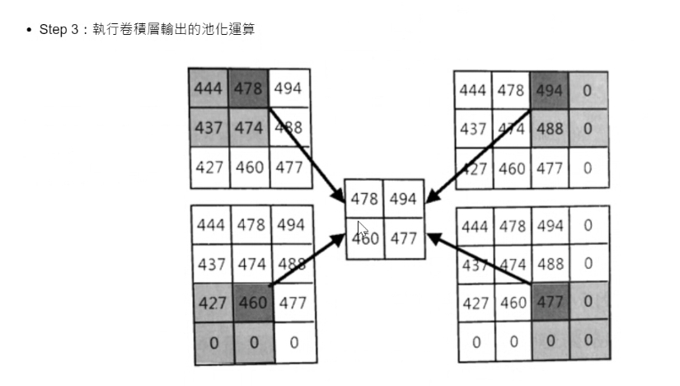
...
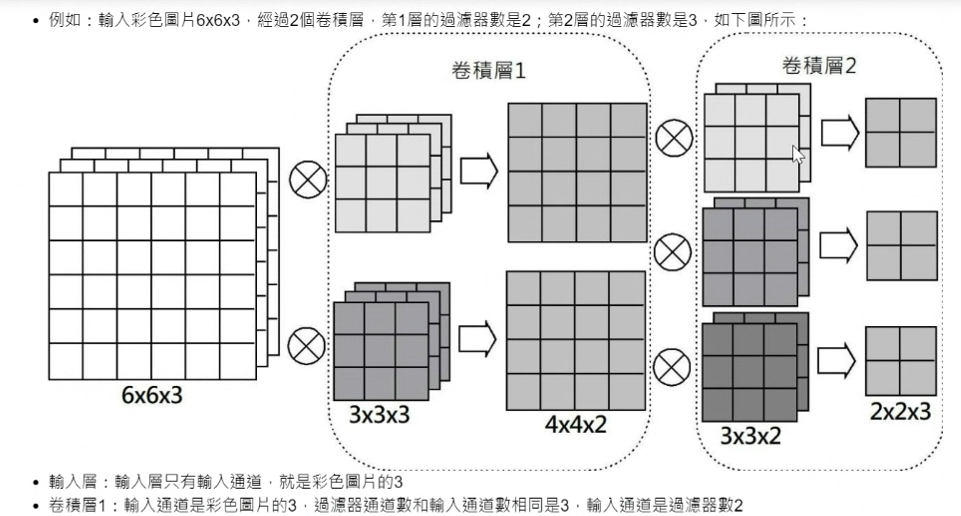
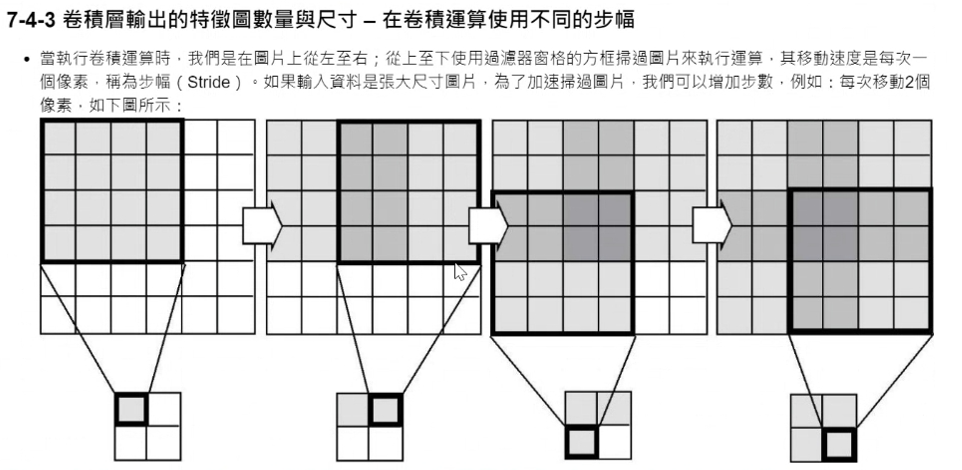
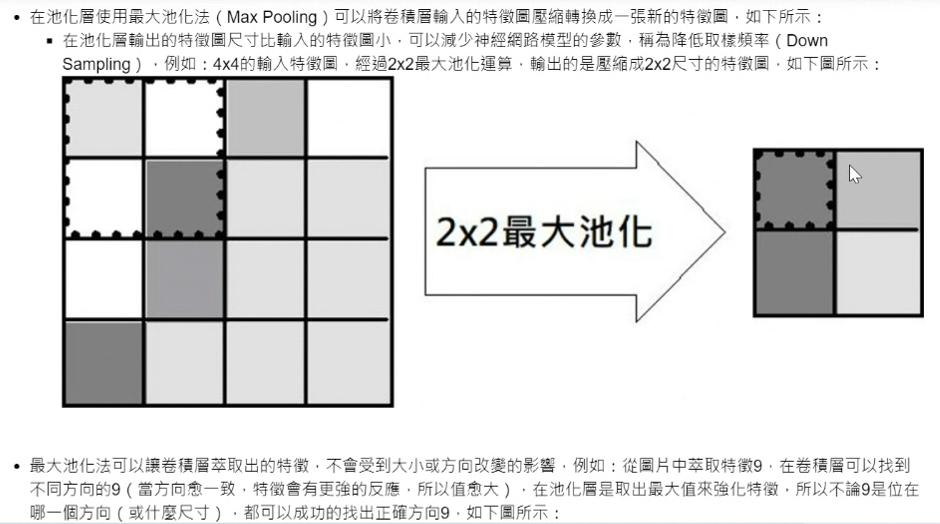
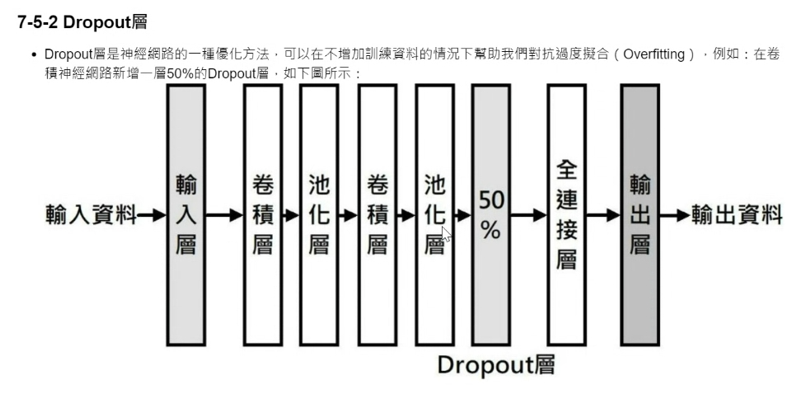
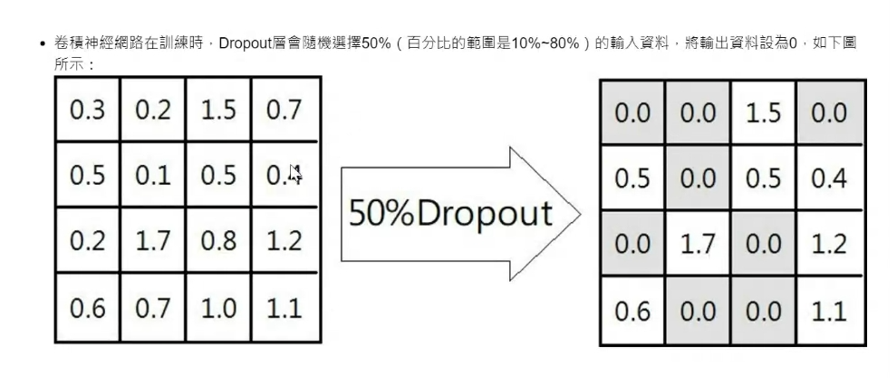

___

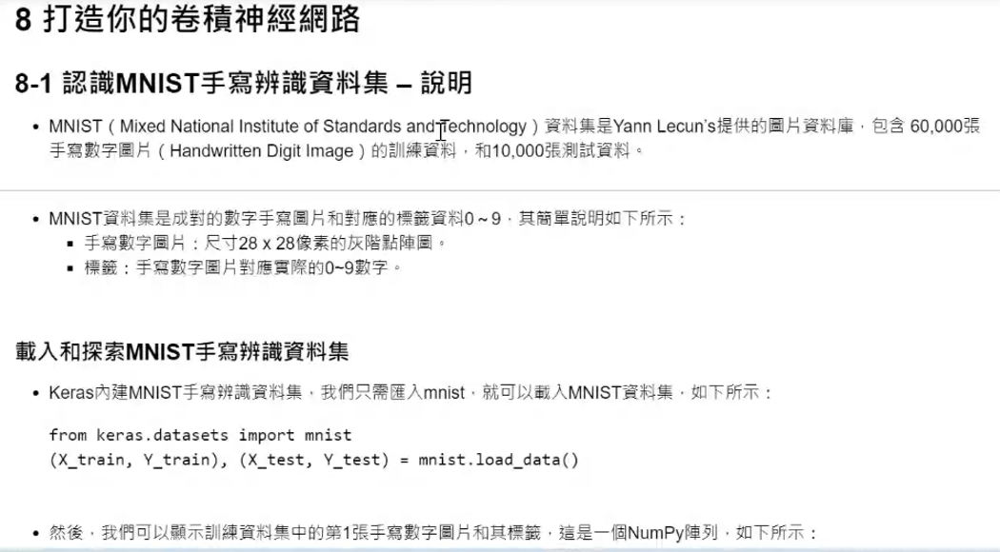
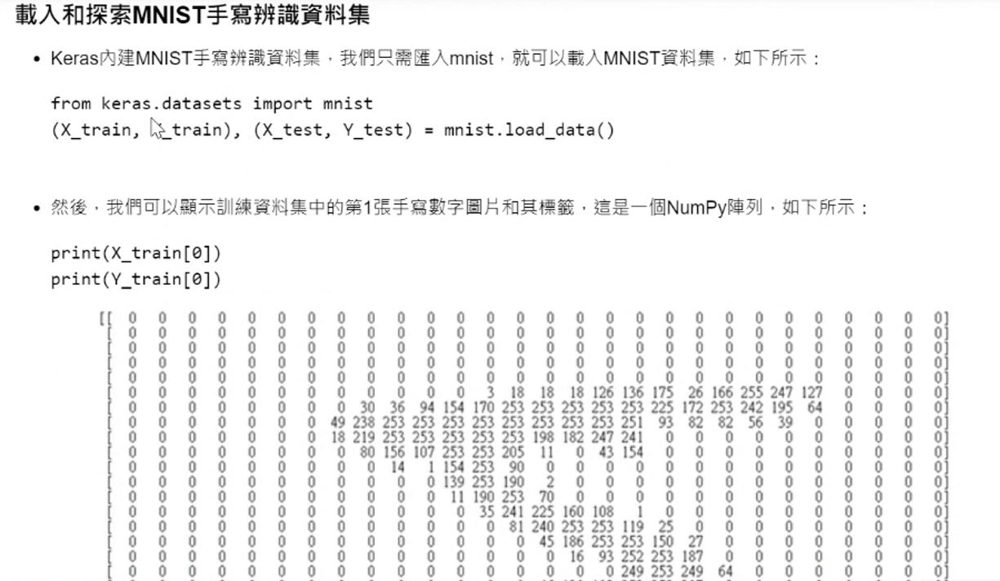
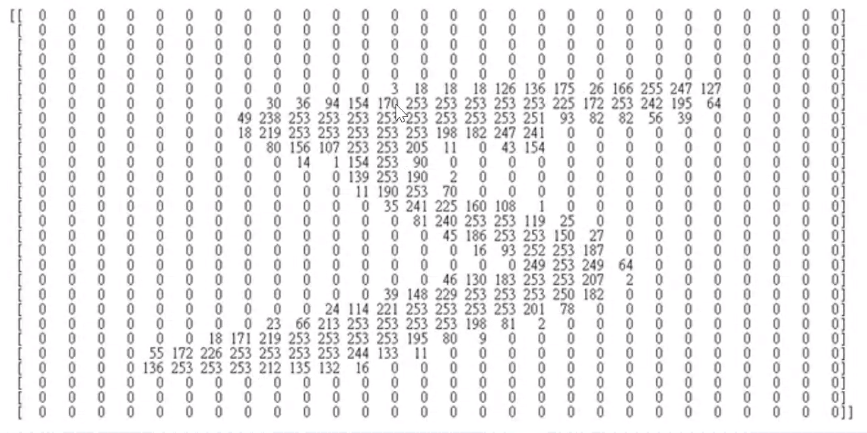
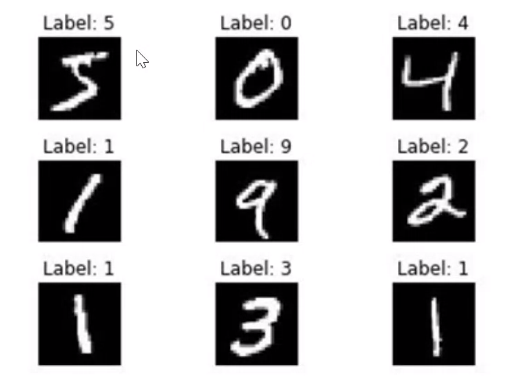

In [4]:
from keras.datasets import mnist

(X_train,Y_train),(X_test,Y_test) = mnist.load_data()

Using TensorFlow backend.


In [5]:
print(X_train[0])

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3  18  18  18 126 136
  175  26 166 255 247 127   0   0   0   0]
 [  0   0   0   0   0   0   0   0  30  36  94 154 170 253 253 253 253 253
  225 172 253 242 195  64   0   0   0   0]
 [  0   0   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251
   93  82  82  56  39   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18 219 253 253 253 253 253 198 18

In [6]:
print(Y_train[0])

5


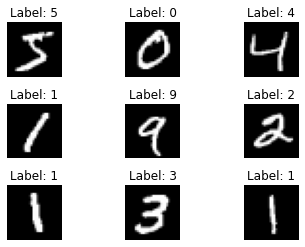

In [7]:
sub_plot = 330  # Form 3x3 subplots
for i in range(0,9):
    ax = plt.subplot(sub_plot+i+1)
    ax.imshow(X_train[i],cmap='gray')
    ax.set_title("Label: "+str(Y_train[i]))
    ax.axis("off")
plt.subplots_adjust(hspace=.5)
plt.show()


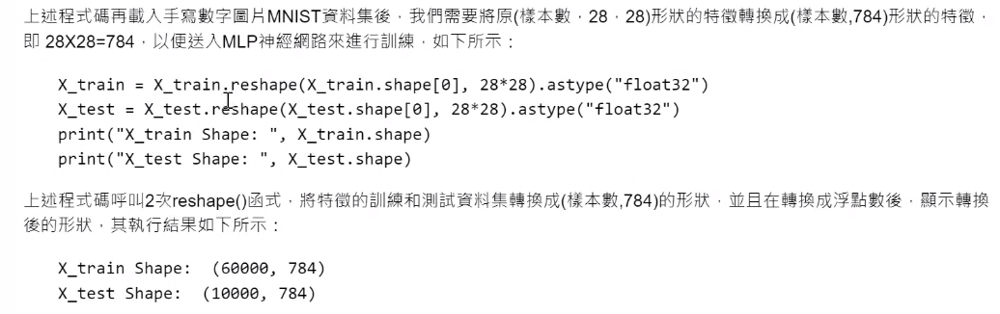
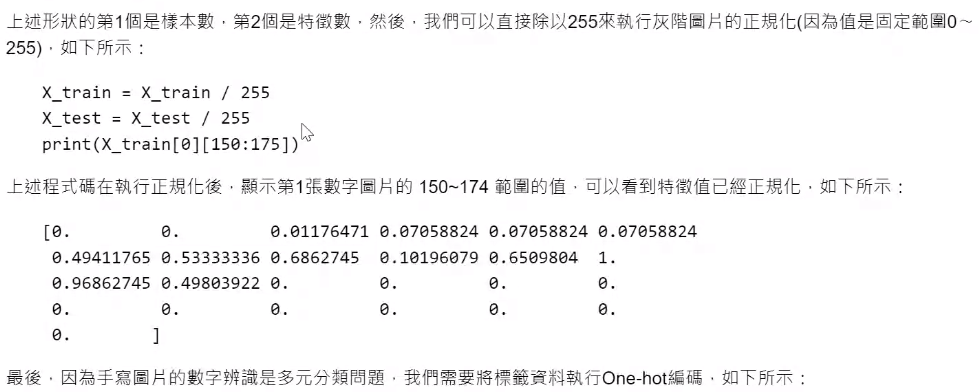
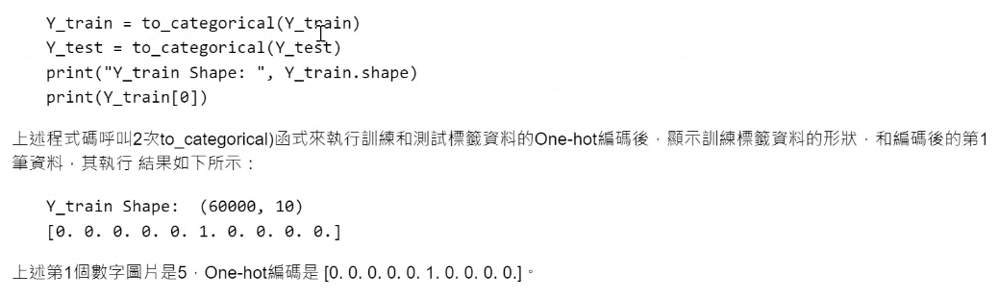


#### 資料前處理

In [8]:
import numpy as np
from keras.datasets import mnist
from keras.utils import to_categorical

seed = 7
np.random.seed(seed)

(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

In [9]:
print(X_train.shape)

(60000, 28, 28)


In [10]:
X_train = X_train.reshape(X_train.shape[0],28*28).astype('float32')
print(X_train.shape)

(60000, 784)


In [11]:
print(X_test.shape)

(10000, 28, 28)


In [12]:
X_test = X_test.reshape(X_test.shape[0],28*28).astype('float32')

In [13]:
X_train = X_train / 255   # 正規化，使之(0~255)介於0~1之間
print(X_train[0])

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         

In [14]:
X_test = X_test / 255   # 正規化，使之介於0~1之間

In [15]:
# One-Hot encoding
print(Y_train[0])
Y_train = to_categorical(Y_train)
print(Y_train[0])

5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


In [16]:
print(Y_train.shape)

(60000, 10)


In [17]:
Y_test = to_categorical(Y_test)

### MLP: 機器學習>監督式學習>神經網路

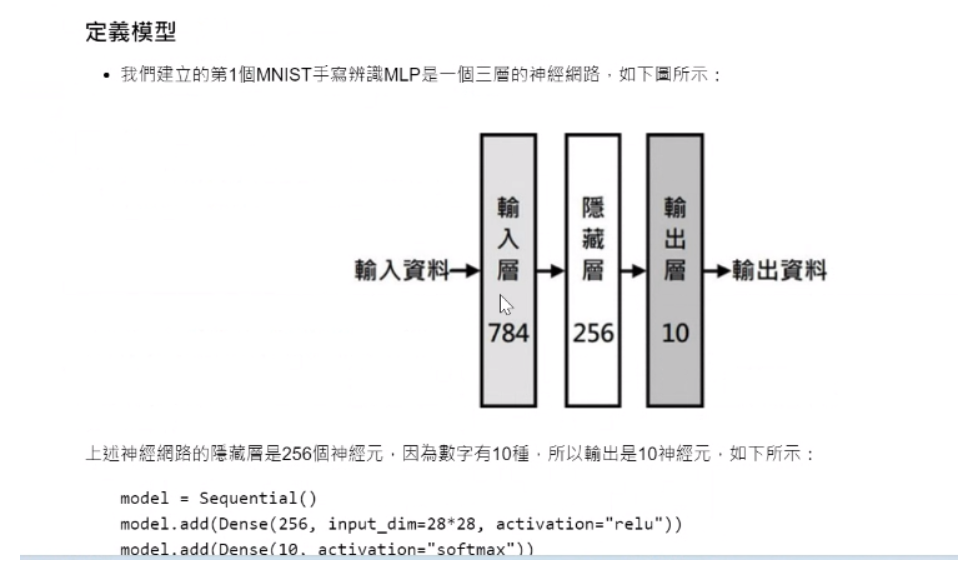
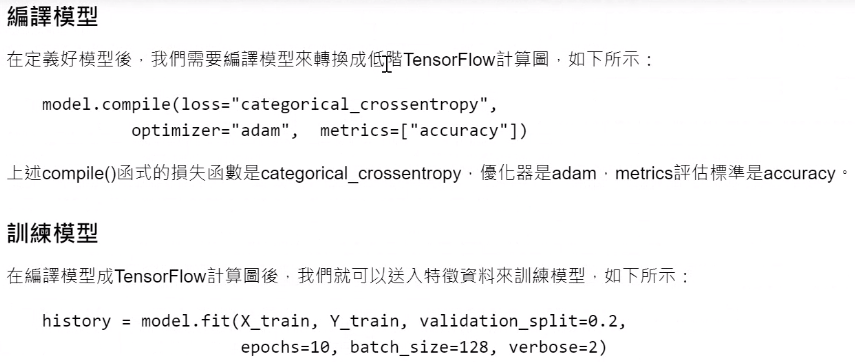
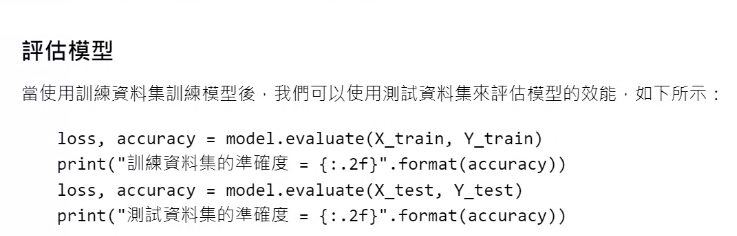

#### 建模

In [18]:
from keras.models import Sequential
from keras.layers import Dense

model = Sequential()   # 輸入層
model.add(Dense(256,input_dim=28*28, activation="relu"))  # 隱藏層
model.add(Dense(10, activation="softmax"))   # 輸出層(轉為機率，使用softmax)
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               200960    
_________________________________________________________________
dense_2 (Dense)              (None, 10)                2570      
Total params: 203,530
Trainable params: 203,530
Non-trainable params: 0
_________________________________________________________________


In [19]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])  # 編譯模型
history = model.fit(X_train,Y_train, validation_split=0.2,
                    epochs=10, batch_size=128, verbose=2)  # 訓練模型 (拆20%做驗證，10回合，每128張圖計算答案平均並做一次修正)

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
 - 4s - loss: 0.3367 - accuracy: 0.9059 - val_loss: 0.1772 - val_accuracy: 0.9518
Epoch 2/10
 - 2s - loss: 0.1511 - accuracy: 0.9566 - val_loss: 0.1331 - val_accuracy: 0.9614
Epoch 3/10
 - 1s - loss: 0.1035 - accuracy: 0.9698 - val_loss: 0.1184 - val_accuracy: 0.9653
Epoch 4/10
 - 1s - loss: 0.0774 - accuracy: 0.9781 - val_loss: 0.0993 - val_accuracy: 0.9722
Epoch 5/10
 - 1s - loss: 0.0591 - accuracy: 0.9835 - val_loss: 0.0854 - val_accuracy: 0.9750
Epoch 6/10
 - 2s - loss: 0.0467 - accuracy: 0.9869 - val_loss: 0.0852 - val_accuracy: 0.9745
Epoch 7/10
 - 1s - loss: 0.0371 - accuracy: 0.9895 - val_loss: 0.0825 - val_accuracy: 0.9747
Epoch 8/10
 - 1s - loss: 0.0287 - accuracy: 0.9927 - val_loss: 0.0781 - val_accuracy: 0.9771
Epoch 9/10
 - 2s - loss: 0.0230 - accuracy: 0.9942 - val_loss: 0.0777 - val_accuracy: 0.9777
Epoch 10/10
 - 2s - loss: 0.0192 - accuracy: 0.9955 - val_loss: 0.0816 - val_accuracy: 0.9769


In [20]:
# 評估模型
loss, accuracy = model.evaluate(X_train,Y_train)
print(accuracy)

60000/60000 [==============================] - 2s 32us/step
0.9929333329200745


In [21]:
# 測試模型
loss, accuracy = model.evaluate(X_test,Y_test)
print(accuracy)

10000/10000 [==============================] - 0s 33us/step
0.977400004863739


#### 繪製圖表

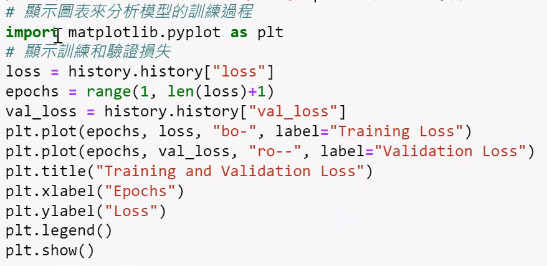
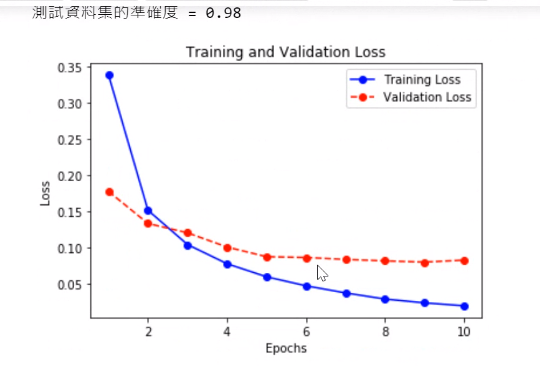

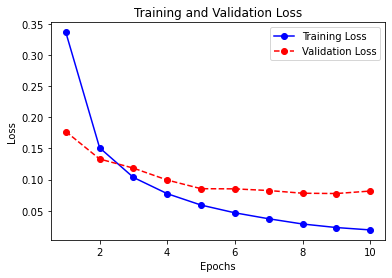

In [22]:
import matplotlib.pyplot as plt
# 顯示訓練和驗證損失
loss = history.history["loss"]
epochs = range(1, len(loss)+1)
val_loss = history.history["val_loss"]
plt.plot(epochs, loss, "bo-", label="Training Loss")
plt.plot(epochs, val_loss, "ro--", label="Validation Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

___
### 增加隱藏層的神經元數量
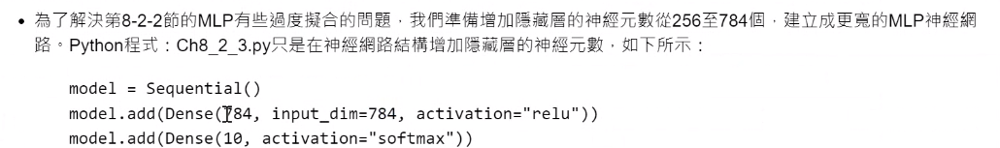

In [ ]:
# from keras.models import Sequential
# from keras.layers import Dense

# model = Sequential()   # 輸入層
# model.add(Dense(784,input_dim=28*28, activation="relu"))  # 隱藏層
# model.add(Dense(10, activation="softmax"))   # 輸出層(轉為機率，使用softmax)
# model.summary()

### 增加一層隱藏層
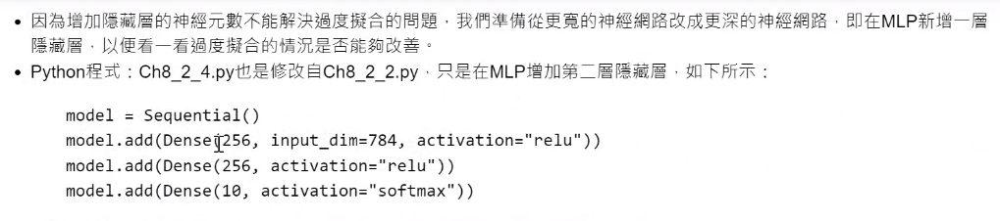

In [ ]:
# from keras.models import Sequential
# from keras.layers import Dense

# model = Sequential()   # 輸入層
# model.add(Dense(256,input_dim=28*28, activation="relu"))  # 隱藏層
# model.add(Dense(256, activation="relu"))  # 隱藏層
# model.add(Dense(10, activation="softmax"))   # 輸出層(轉為機率，使用softmax)
# model.summary()

### 新增一層DropOut層
為了避免訓練模型過度擬合，增加一層DropOut層，每回合訓練時隨機切斷神經元的連結。
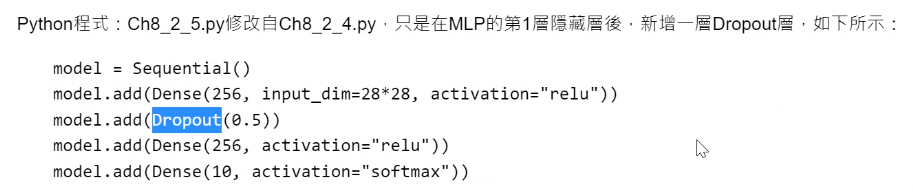

## 使用CNN: 監督式學習>卷積神經網路

#### 匯入資料集

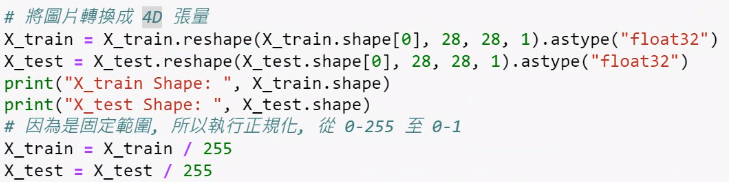
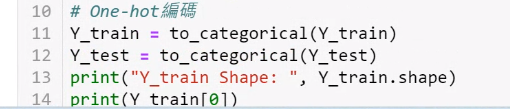

In [1]:
import numpy as np
from keras.datasets import mnist
from keras.utils import to_categorical

# 指定亂數種子
seed = 7
np.random.seed(seed)
# 匯入資料集
(X_train,Y_train),(X_test,Y_test) = mnist.load_data()

## 資料預處理
# 圖片轉成 4維張量
X_train = X_train.reshape(X_train.shape[0],28,28,1).astype('float32')
X_test = X_test.reshape(X_test.shape[0],28,28,1).astype('float32')
 # 正規化，使之介於0~1之間
X_train = X_train / 255 
X_test = X_test / 255  
# One-Hot encoding
Y_train = to_categorical(Y_train)
Y_test = to_categorical(Y_test)

Using TensorFlow backend.


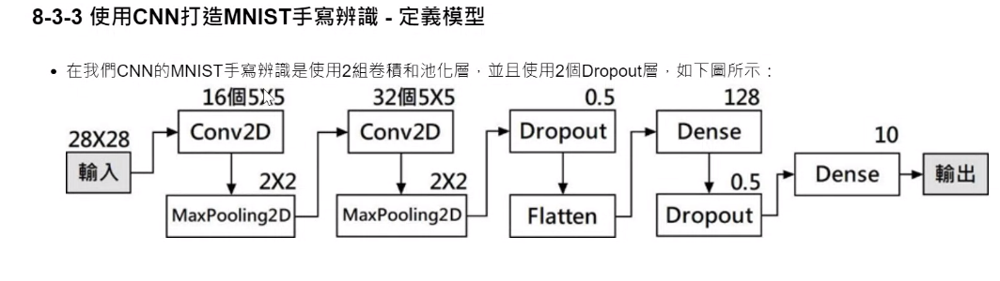

In [2]:
print(X_train.shape)
print(X_test.shape)
print(Y_train[0])

(60000, 28, 28, 1)
(10000, 28, 28, 1)
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]


In [3]:
# 載入模組
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten

In [4]:
# 建立CNN模型
model = Sequential()
model.add(Conv2D(16,kernel_size=(5,5),padding="same",
                input_shape=(28,28,1),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Conv2D(32,kernel_size=(5,5),padding="same",
                input_shape=(28,28,1),activation="relu"))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(10, activation="softmax"))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 28, 28, 16)        416       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 32)        12832     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 7, 7, 32)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1568)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)              

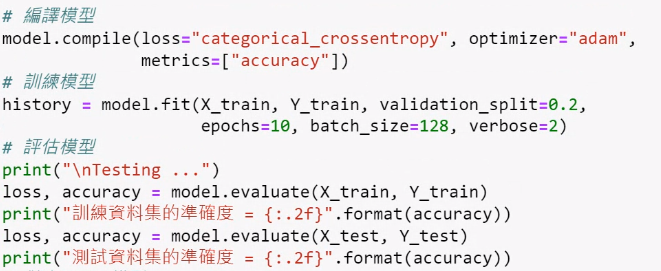

In [5]:
# 編譯模型
model.compile(loss="categorical_crossentropy",optimizer="adam",
             metrics=["accuracy"])

In [6]:
# 訓練模型
history = model.fit(X_train, Y_train, validation_split=0.2,
                    epochs=10, batch_size=128, verbose=2)

Train on 48000 samples, validate on 12000 samples
Epoch 1/10
 - 32s - loss: 0.4213 - accuracy: 0.8669 - val_loss: 0.0835 - val_accuracy: 0.9752
Epoch 2/10
 - 32s - loss: 0.1375 - accuracy: 0.9582 - val_loss: 0.0570 - val_accuracy: 0.9837
Epoch 3/10
 - 31s - loss: 0.1047 - accuracy: 0.9680 - val_loss: 0.0473 - val_accuracy: 0.9865
Epoch 4/10
 - 31s - loss: 0.0866 - accuracy: 0.9740 - val_loss: 0.0436 - val_accuracy: 0.9873
Epoch 5/10
 - 30s - loss: 0.0753 - accuracy: 0.9767 - val_loss: 0.0389 - val_accuracy: 0.9893
Epoch 6/10
 - 30s - loss: 0.0699 - accuracy: 0.9793 - val_loss: 0.0352 - val_accuracy: 0.9899
Epoch 7/10
 - 31s - loss: 0.0615 - accuracy: 0.9812 - val_loss: 0.0342 - val_accuracy: 0.9904
Epoch 8/10
 - 30s - loss: 0.0560 - accuracy: 0.9834 - val_loss: 0.0345 - val_accuracy: 0.9907
Epoch 9/10
 - 30s - loss: 0.0529 - accuracy: 0.9838 - val_loss: 0.0326 - val_accuracy: 0.9908
Epoch 10/10
 - 31s - loss: 0.0498 - accuracy: 0.9847 - val_loss: 0.0360 - val_accuracy: 0.9909


In [7]:
# 評估模型 (驗證)
loss, accuracy = model.evaluate(X_train, Y_train)
print(loss, accuracy)

60000/60000 [==============================] - 13s 208us/step
0.02084672433733746 0.9940666556358337


In [8]:
# 評估模型 (測試)
loss, accuracy = model.evaluate(X_test, Y_test)
print(loss, accuracy)

10000/10000 [==============================] - 2s 215us/step
0.024735424399760994 0.9918000102043152


In [9]:
# 儲存模型，方便以後使用
model.save("./data/mnist.h5")

#### 繪製圖表
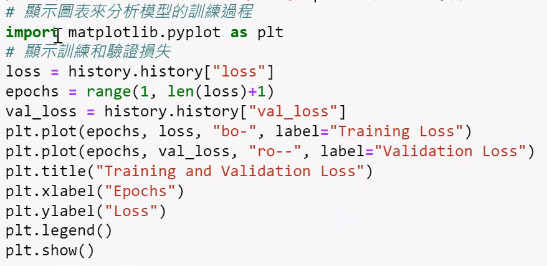

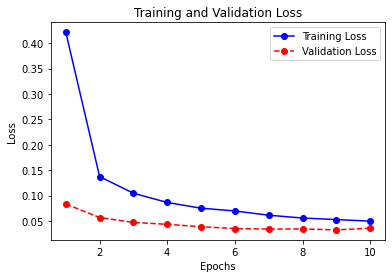

In [10]:
import matplotlib.pyplot as plt
# 顯示訓練和驗證損失
loss = history.history["loss"]
epochs = range(1, len(loss)+1)
val_loss = history.history["val_loss"]
plt.plot(epochs, loss, "bo-", label="Training Loss")
plt.plot(epochs, val_loss, "ro--", label="Validation Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

___
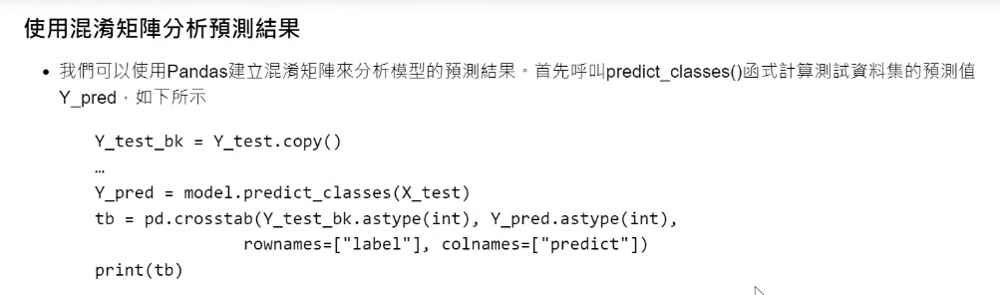

In [11]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten

import numpy as np
import pandas as pd
from keras.datasets import mnist
from keras.models import load_model
from keras.utils import to_categorical

In [12]:
# 指定亂數種子
seed = 7
np.random.seed(seed)
# 匯入資料集
(X_train,Y_train),(X_test,Y_test) = mnist.load_data()

以下使用先前建立的模型去預測測試集，故此處不處理訓練集。

In [13]:
## 資料預處理
# 圖片轉成 4維張量
X_test = X_test.reshape(X_test.shape[0],28,28,1).astype('float32')
 # 正規化，使之介於0~1之間
X_test = X_test / 255  
# One-Hot encoding
Y_test_bk = Y_test.copy() # 備分資料集 Y_test
Y_test = to_categorical(Y_test)

In [15]:
# 定義模型
model = Sequential()
model = load_model("./data/mnist.h5")
# 編譯模型
model.compile(loss="categorical_crossentropy",optimizer="adam",
             metrics=["accuracy"])

In [16]:
# 預測模型
Y_pred = model.predict_classes(X_test)

#### 分析預測結果，建立混淆矩陣比對預測值與正確答案的準確程度
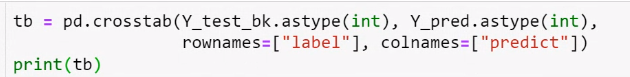

In [17]:
# 印出模型預測值Y_pred，並與正確答案Y_test比對
print(Y_pred[0])
print(Y_test_bk[0])

7
7


In [18]:
tb = pd.crosstab(Y_test_bk.astype(int),Y_pred.astype(int),
                rownames=["label"],colnames=["predict"])
print(tb)

predict    0     1     2     3    4    5    6     7    8    9
label                                                        
0        976     0     0     0    0    0    2     1    1    0
1          0  1133     1     1    0    0    0     0    0    0
2          0     2  1028     0    0    0    0     2    0    0
3          0     0     1  1005    0    2    0     1    1    0
4          0     0     0     0  981    0    0     0    0    1
5          2     0     0     6    0  882    1     0    0    1
6          1     2     0     0    2    1  952     0    0    0
7          0     2     4     2    0    0    0  1019    1    0
8          1     1     3     1    1    0    0     2  963    2
9          2     2     0     3   10    7    1     7    2  975


#### 匯出圖片(預測機率)
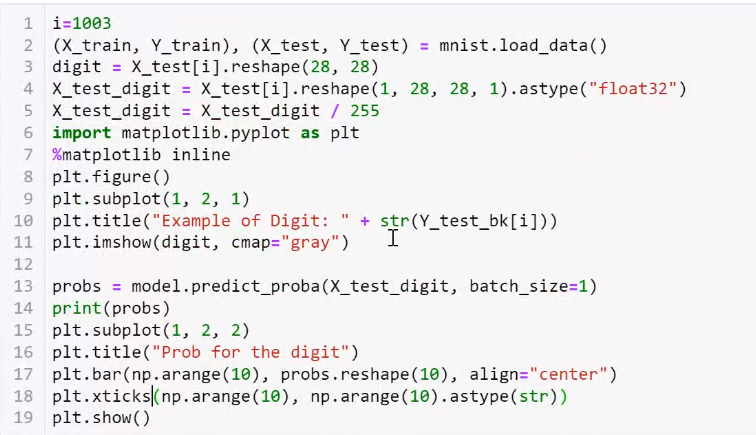

[[7.7251900e-07 8.9028722e-11 1.2013068e-11 2.3554284e-12 3.7174669e-08
  4.0598587e-09 9.9999917e-01 7.0884630e-15 7.1304811e-09 8.8899840e-13]]


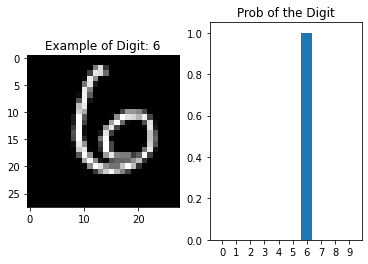

In [19]:
# 想要預測的圖像(編號，介於測試集長度之間)
i = 100
# 指定亂數種子
seed = 7
np.random.seed(seed)
# 匯入資料集
(X_train,Y_train),(X_test,Y_test) = mnist.load_data()
# 記錄圖像資料
digit = X_test[i].reshape(28,28)

# 轉成 4D 張量
X_test_digit = X_test[i].reshape(1,28,28,1).astype("float32")
X_test_digit = X_test_digit / 255

import matplotlib.pyplot as plt
%matplotlib inline

# 繪製圖片
plt.figure()
plt.subplot(1,2,1)
plt.title("Example of Digit: " + str(Y_test_bk[i]))
plt.imshow(digit, cmap="gray")

# 計算機率
probs = model.predict_proba(X_test_digit, batch_size=1)
print(probs)

# 繪製機率分布圖
plt.subplot(1,2,2)
plt.title("Prob of the Digit")
plt.bar(np.arange(10),probs.reshape(10), align="center")
plt.xticks(np.arange(10),np.arange(10).astype(str))
plt.show()

___
___
# 作業
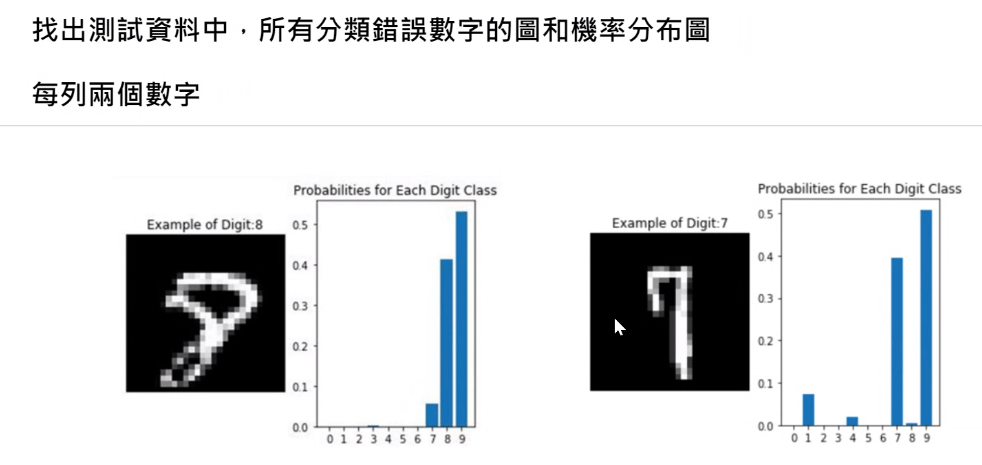

In [20]:
## 建構預測模型
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten

import numpy as np
import pandas as pd
from keras.datasets import mnist
from keras.models import load_model
from keras.utils import to_categorical

# 指定亂數種子
seed = 7
np.random.seed(seed)
# 匯入資料集
(X_train,Y_train),(X_test,Y_test) = mnist.load_data()

## 資料預處理
# 圖片轉成 4維張量
X_test = X_test.reshape(X_test.shape[0],28,28,1).astype('float32')
 # 正規化，使之介於0~1之間
X_test = X_test / 255  
# One-Hot encoding
Y_test_bk = Y_test.copy() # 備分資料集 Y_test
Y_test = to_categorical(Y_test)

# 定義模型(載入已訓練好的模型)
model = Sequential()
model = load_model("./data/mnist.h5")
# 編譯模型
model.compile(loss="categorical_crossentropy",optimizer="adam",
             metrics=["accuracy"])
# 預測模型
Y_pred = model.predict_classes(X_test)

In [21]:
# 印出模型預測值Y_pred，並與正確答案Y_test比對
print(Y_pred[0])
print(Y_test_bk[0])

7
7


In [29]:
# 比對是否相同
print(Y_pred[0]==Y_test_bk[0])
print(len(Y_pred),len(Y_test_bk))

True
10000 10000


In [28]:
for i,x in enumerate(Y_test_bk):
    print(Y_pred[i]==Y_test_bk[i]) 

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
Tru

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [41]:
# 測試集的長度
test_length = len(X_test)
print(test_length)
# 找出分類錯誤的數字編號
num_err = [i for i in range(test_length) if (Y_pred[i]!=Y_test_bk[i])]
print(num_err)
print(len(num_err))

# 每列兩個數字，總列數為 ceil(分類錯誤的數字的數量/2)
cols = 2
mods = len(num_err) % 2
if mods == 1: rows = int(len(num_err)/2)+1
else: rows = int(len(num_err)/2)
print(cols)
print(rows)

10000
[340, 445, 582, 684, 1014, 1033, 1039, 1226, 1232, 1247, 1260, 1393, 1414, 1530, 1621, 1709, 1878, 1901, 2035, 2109, 2129, 2130, 2135, 2182, 2293, 2387, 2582, 2597, 2648, 2654, 2720, 2760, 2896, 2927, 2939, 3073, 3520, 3558, 3597, 3727, 3767, 3808, 3850, 3869, 3985, 4078, 4163, 4176, 4224, 4238, 4284, 4360, 4369, 4384, 4497, 4500, 4731, 4740, 4761, 4823, 4956, 5937, 5955, 5997, 6011, 6091, 6166, 6172, 6505, 6571, 6576, 6597, 6625, 6651, 6740, 6755, 6847, 8059, 8325, 9015, 9587, 9642, 9664, 9692, 9729, 9770]
86
2
43


In [47]:
# 計算每個數字是在左邊還是右邊(由索引的餘數判斷)，存成字典
num_err_col = {}
for j, x in enumerate(num_err):
    num_err_col[x] = j % 2
print(num_err_col)

{340: 0, 445: 1, 582: 0, 684: 1, 1014: 0, 1033: 1, 1039: 0, 1226: 1, 1232: 0, 1247: 1, 1260: 0, 1393: 1, 1414: 0, 1530: 1, 1621: 0, 1709: 1, 1878: 0, 1901: 1, 2035: 0, 2109: 1, 2129: 0, 2130: 1, 2135: 0, 2182: 1, 2293: 0, 2387: 1, 2582: 0, 2597: 1, 2648: 0, 2654: 1, 2720: 0, 2760: 1, 2896: 0, 2927: 1, 2939: 0, 3073: 1, 3520: 0, 3558: 1, 3597: 0, 3727: 1, 3767: 0, 3808: 1, 3850: 0, 3869: 1, 3985: 0, 4078: 1, 4163: 0, 4176: 1, 4224: 0, 4238: 1, 4284: 0, 4360: 1, 4369: 0, 4384: 1, 4497: 0, 4500: 1, 4731: 0, 4740: 1, 4761: 0, 4823: 1, 4956: 0, 5937: 1, 5955: 0, 5997: 1, 6011: 0, 6091: 1, 6166: 0, 6172: 1, 6505: 0, 6571: 1, 6576: 0, 6597: 1, 6625: 0, 6651: 1, 6740: 0, 6755: 1, 6847: 0, 8059: 1, 8325: 0, 9015: 1, 9587: 0, 9642: 1, 9664: 0, 9692: 1, 9729: 0, 9770: 1}


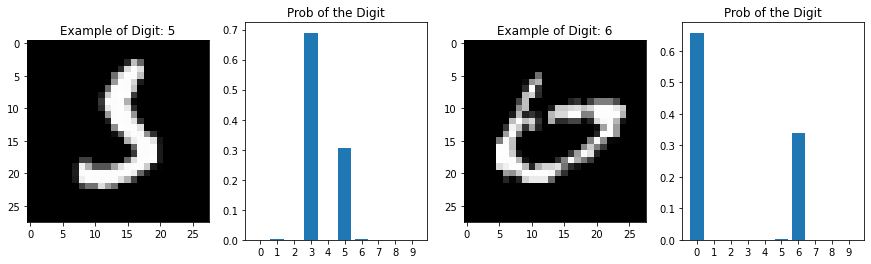

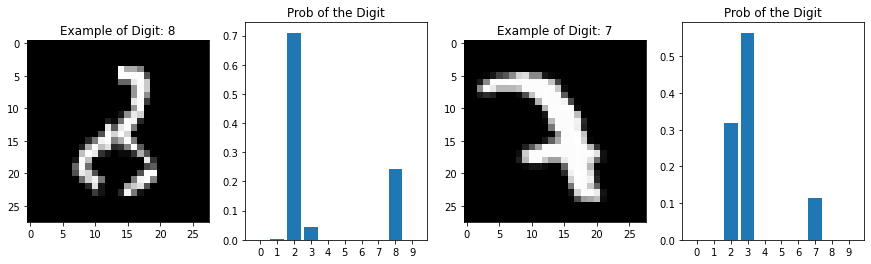

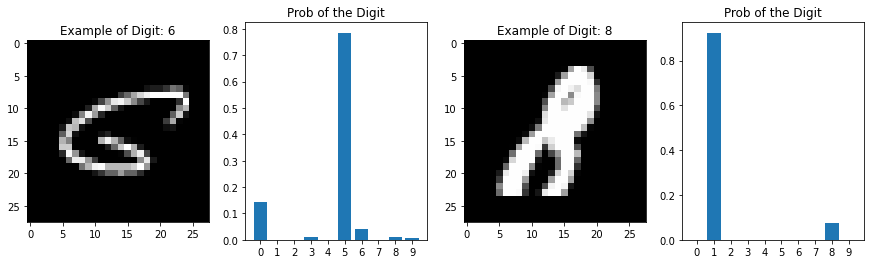

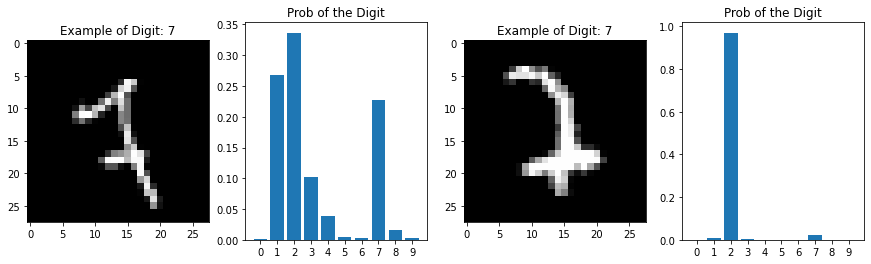

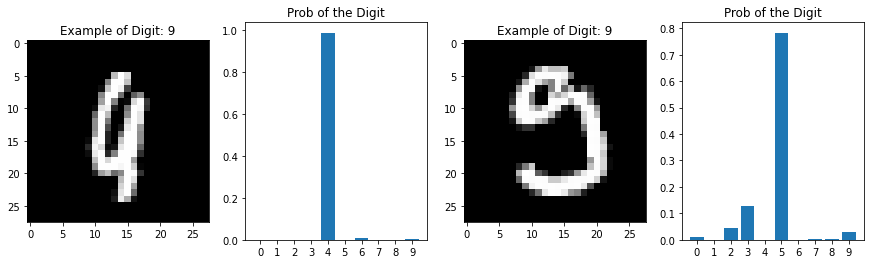

...

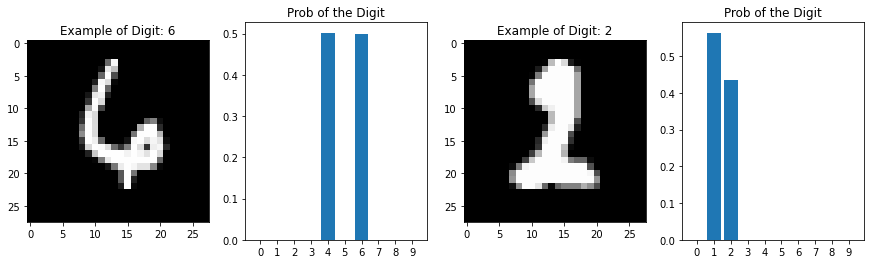

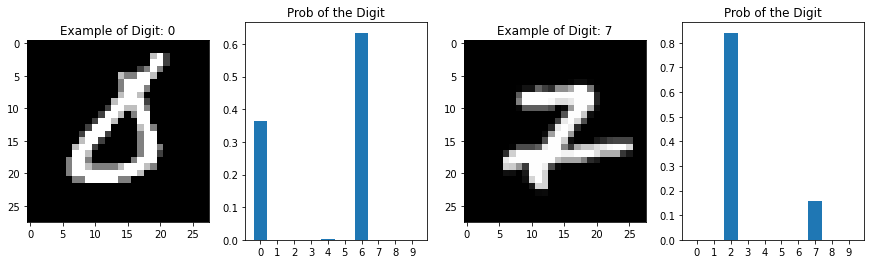

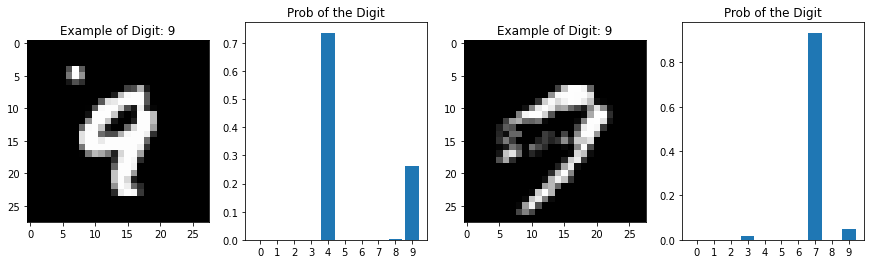

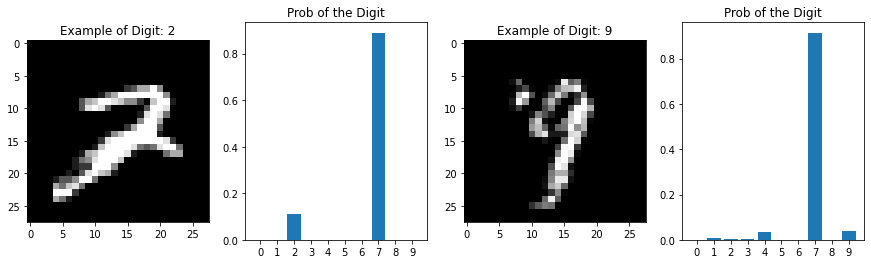

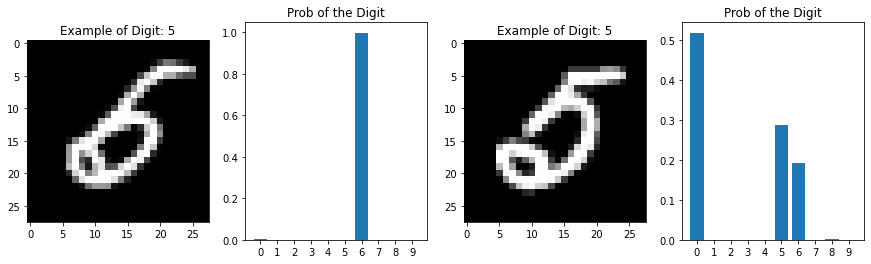

In [53]:
import matplotlib.pyplot as plt
%matplotlib inline

# 找出分類錯誤的數字有哪些，取出它們的編號
num_err = [j for j in range(test_length) if (Y_pred[j]!=Y_test_bk[j])]
# 每列兩個數字(cols)，從分類錯誤的數字的數量來計算總列數(rows)
cols = 2
mods = len(num_err) % 2
if mods == 1: rows = int(len(num_err)/2)+1
else: rows = int(len(num_err)/2)

# 計算每個數字是在左邊還是右邊(由索引的餘數判斷)，存成字典
num_err_col = {}
for j, x in enumerate(num_err):
    num_err_col[x] = j % 2
# print(num_err_col)
    
# 指定亂數種子
seed = 7
np.random.seed(seed)
# 匯入資料集
(X_train,Y_train),(X_test,Y_test) = mnist.load_data()

row = 0
for x in num_err:
# 預測錯誤的圖像編號
    i = x
# 記錄圖像資料
    digit = X_test[i].reshape(28,28)
# 轉成 4D 張量
    X_test_digit = X_test[i].reshape(1,28,28,1).astype("float32")
    X_test_digit = X_test_digit / 255
# 繪製圖片
    if num_err_col[i] == 0:
        plt.figure(figsize=[15,4])
        plt.subplot(1,4,1)
    if num_err_col[i] == 1:
        plt.subplot(1,4,3)
    plt.title("Example of Digit: " + str(Y_test_bk[i]))
    plt.imshow(digit, cmap="gray")
# 計算機率
    probs = model.predict_proba(X_test_digit, batch_size=1)
    # print(probs)
# 繪製機率分布圖
    if num_err_col[i] == 0:
        plt.subplot(1,4,2)
    if num_err_col[i] == 1:
        plt.subplot(1,4,4)
    plt.title("Prob of the Digit")
    plt.bar(np.arange(10),probs.reshape(10), align="center")
    plt.xticks(np.arange(10),np.arange(10).astype(str))
    
# 換行，到最後一行時停止
    if num_err_col[i] == 1:
        plt.show()
        row = row + 1
    if row >= rows:
        break